# $\color{blue}{\text{MADE}}$ $\bullet$ $\color{red}{\text{CV}}$ $\bullet$ HW№1
### Преподаватели: [*Даниил Лысухин*](https://github.com/lysukhin), [*Федор Киташов*](https://github.com/owoshch), [*Иван Карпухин*](https://istina.msu.ru/profile/ivan-chai/), [*Борис Лесцов*](https://github.com/BorisLestsov) 
### Выполнил: $\text{Саит Шарипов, группа MADE-DS-22}$
### [🔗 Соревнование Kaggle](https://www.kaggle.com/competitions/vkcv2022-contest-01-facial-landmarks)
### [🔗 Разбор 2021 года](https://www.youtube.com/watch?v=CBsbo_CYTow&t=2587s)
### 😱 Predict (almost!) a thousand facial landmarks using Deep Learning.
* * *

## 📝 Описание задания:
Первое задание курса - регрессия ключевых точек лица.  

![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F255299%2Fc845261fb2a65a3da76cdfe6d83bd7e5%2Fsample.jpg?generation=1585387760750378&alt=media)  

В обучающей выборке $64000$ изображений лиц из датасета VGGFace, для каждого лица известны координаты $(x, y)$ $971$ ключевой точки.  
Файл с координатами точек для всех лиц: `train/landmarks.csv.`

В тестовой выборке $16000$ изображений.

[Ссылка](https://cloud.mail.ru/public/xPaB/twWLKix2c) для скачивания данных.

## 📈 Оценивание:
Позиция на LB определяется по *MSE (Mean Squared Error)*, между предсказанными и *ground-truth* координатами ключевых точек.  
Для каждого изображения случайным образом были выбраны $30$ ключевых точек, их индексы можно найти в файле `test/test_points.csv`.

Пример файла сабмита в правильном формате -- `sampleSubmission.csv`.

Перед дедлайном выберите $2$ сабмита, которые будут учитываться при итоговом определении скоров на LB. В день доступно $5$ посылок.

## ☝🏻 Правила начисления баллов за задание:
1. Задание индивидуальное, команды не разрешены.
2. Даны $5$ бейзлайнов (на LB отмечены как `Baseline_XXpts`), каждый из которых соответствует своему гарантированному (`XX`) количеству баллов, которое получат участники со скором на Private LB не ниже этого бейзлайна. Максимальный скор по бейзлайнам - $50$ баллов.
3. Участники, занявшие $1-5$ места, получат дополнительные $25$/$20$/$15$/$10$/$5$ баллов, соотвественно.
4. До $15$ дополнительных баллов могут получить участники, которые будут делиться полезным кодом (но не полными решениями!), ссылками, статьями или идеями с другими участниками в разделах `Code`/`Discussion` соревнования.

Итого, по итогу можно получить максимум $90$ баллов - $50$ "основных" + $40$ "бонусных".

## 📌 Рекомендации по выполнению:
1. Разберитесь с данными. Определите, имеют ли место:
    * Некорректная разметка.
    * Особые случаи.
    * Несоответствие доменов обучающей/тестовой выборок.
    * Если да, то что с ними делать?


2. Работа с моделью:
    * Настройте пайплайн обучения сначала с простой моделью, только затем переходите к более тяжелым моделям.
    * Используйте код предобученных моделей ([отсюда](https://github.com/rwightman/pytorch-image-models), [отсюда](https://github.com/Cadene/pretrained-models.pytorch) или [отсюда](https://pytorch.org/vision/stable/models.html)).


3. Гиперпараметры, ансамблирование и прочее:
    * Не застревайте на подборе гиперпараметров. Найдите "хорошую" комбинацию и экспериментируйте с другими частями пайплайна, тонкий подбор - в последнюю очередь.
    * Аналогично с ансамблированием - если собираетесь делать его, то тоже в конце.


4. Погрузитесь в задачу:
    * Если хотите улучшить качество, но свои идеи закончились - обратитесь к публикациям по данной теме (`Facial landmarks detection`), там могут быть советы по аугментациям, функциям потерь, ...

## ⛔️ Ограничения:
**Разрешается:**  
Использовать предобученные модели из репозиториев, указанных в п.2 выше (или других по согласованию с преподавателями курса, спрашивайте в дискорде)


**Не разрешается:**  
Использовать сторонние данные или модели, предобученные на датасетах для определения ключевых точек лица.  
Использовать файлы с сабмитами других участников.  
Использовать несколько учетных записей.  

## 👶🏻 Стартовый код:
Для первого задания мы решили поделиться "черновиком" решения, с которого можно начинать. С его помощью можно обучить простую модель, сгенерировать файл с предсказаниями в ожидаемом платформой формате и отрисовать результаты предсказаний. Вот [ссылка](https://github.com/lysukhin/MADE/tree/2022/computer_vision/contest01_landmarks).

## 💡 Идеи:
1. Увеличить CROP_SIZE изображений.
2. Разморозить все слои при обучении.
3. Использовать learning rate scheduler. В частности ReduceLROnPlateau.
4. Использовать аугментации.
5. Модели resnet50, resnext50, densenet161 ...
6. bias для слоя классификации можно проинициализировать чем-то на изображении.
7. Нормализацию стоит выполнить также как для ImageNet.
8. Ансамблирование моделей, причем можно просто скачать свои сабмиты и усреднить их.
9. Другой loss. L1 или даже SmoothL1.
10. L2 регуляризацию на веса в Adam, с помщью параметра weight_decay в нём.
11. Возможно в конце надо обучить один раз на всем TRAIN - TRAIN_SIZE = 0.99,
12. Правильно считать точность на валидации с учетом CROP.

# ✅ Решение

### Необходимые библиотеки и константы:

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

# OpenCV
import cv2

# PyTorch
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.nn import functional as fnn
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

# Для работы с файловой системой.
import os
import pickle

# Для просмотра прогресса выполнения циклов.
from tqdm import tqdm

# Библиотека для аугментации картинок
import albumentations as A 

import copy


np.random.seed(1234)
torch.manual_seed(1234)


TRAIN_SIZE = 0.8 # значит 80% на train и 20% на val
NUM_PTS = 971    # кол-во ключевых точек
CROP_SIZE = 224 # был 128 (можно делать и больше - 256 или 300)
SUBMISSION_HEADER = "file_name,Point_M0_X,Point_M0_Y,Point_M1_X,Point_M1_Y,Point_M2_X,Point_M2_Y,Point_M3_X,Point_M3_Y,Point_M4_X,Point_M4_Y,Point_M5_X,Point_M5_Y,Point_M6_X,Point_M6_Y,Point_M7_X,Point_M7_Y,Point_M8_X,Point_M8_Y,Point_M9_X,Point_M9_Y,Point_M10_X,Point_M10_Y,Point_M11_X,Point_M11_Y,Point_M12_X,Point_M12_Y,Point_M13_X,Point_M13_Y,Point_M14_X,Point_M14_Y,Point_M15_X,Point_M15_Y,Point_M16_X,Point_M16_Y,Point_M17_X,Point_M17_Y,Point_M18_X,Point_M18_Y,Point_M19_X,Point_M19_Y,Point_M20_X,Point_M20_Y,Point_M21_X,Point_M21_Y,Point_M22_X,Point_M22_Y,Point_M23_X,Point_M23_Y,Point_M24_X,Point_M24_Y,Point_M25_X,Point_M25_Y,Point_M26_X,Point_M26_Y,Point_M27_X,Point_M27_Y,Point_M28_X,Point_M28_Y,Point_M29_X,Point_M29_Y\n"

PATH_DATA = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/"
PATH_TRAIN = os.path.join(PATH_DATA, "train")
PATH_TRAIN_IMAGE = os.path.join(PATH_TRAIN, "images")
PATH_TRAIN_LANDMARK = os.path.join(PATH_TRAIN, "landmarks.csv")
PATH_MY_IMAGES = "../input/my-photo"
PATH_TEST = os.path.join(PATH_DATA, "test")
BATCH_SIZE = 64

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Вспомогательные функции:

In [3]:
def show_image_from_path(path_image):
    """Рисуем изображение по пути до него."""
    img = cv2.imread(path_image)      # читаем изображение
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
    plt.figure()
    plt.imshow(img)

In [4]:
def draw_landmarks(img, landmarks):
    """
    Рисует цветные ключевые точки на лице.
    landmarks: np.array.
    """
    image = np.copy(img) # чтобы исходное изображение не менялось
    for i, point in enumerate(landmarks):
        if 0 <= i and i < 273:    # ОВАЛ ЛИЦА
            color = (0, 0, 255)
        elif 273 <= i and i < 401: # БРОВИ
            color = (128, 0, 0)
        elif 401 <= i and i < 587: # НОС
            color = (255, 255, 0)
        elif 587 <= i and i < 841: # ГЛАЗА
            color = (0, 255, 255)
        elif 841 <= i and i < 969: # РОТ
            color = (255, 0, 0)
        elif 969 <= i < 971: # ЗРАЧКИ
            color = (0, 0, 0)
        x, y = point.astype(np.int32)
        cv2.circle(img=image, center=(x, y), radius=1, color=color, thickness=-1)
    return image

In [5]:
robert_de_niro_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/3ce64cc92545b9c33424f2ef65bb86f0.jpg"
brad_pitt_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/d5a277caf04a277113cbdf6590bb1f6f.jpg"
dwayne_johnson_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/acf8a79eb7f4c7709c8b9b22ad7dcf91.jpg"

train_images_for_visualization_path = set([
    robert_de_niro_img_path,
    brad_pitt_img_path,
    dwayne_johnson_img_path,
])

train_samples_for_visualization = []
img_paths = []
img_landmarks = []

with open(PATH_TRAIN_LANDMARK, "rt") as fp:
    for i, line in enumerate(fp):
        if i == 0:
            continue  # skip header
        
        elements = line.strip().split("\t")
        image_name = os.path.join(PATH_TRAIN_IMAGE, elements[0])
        
        if image_name in train_images_for_visualization_path:
            
            img_paths.append(image_name)
            
            landmarks = list(map(np.int32, elements[1:]))
            landmarks = np.array(landmarks, dtype=np.int32).reshape((len(landmarks) // 2, 2))
            
            img_landmarks.append(landmarks)

img_landmarks = torch.as_tensor(img_landmarks)

for i, img_name in enumerate(img_paths):
    sample = {}
    
    image = cv2.imread(img_name)      # читаем изображение
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
    
    sample["image"] = image
    sample["landmarks"] = img_landmarks[i]
    
    train_samples_for_visualization.append(sample)

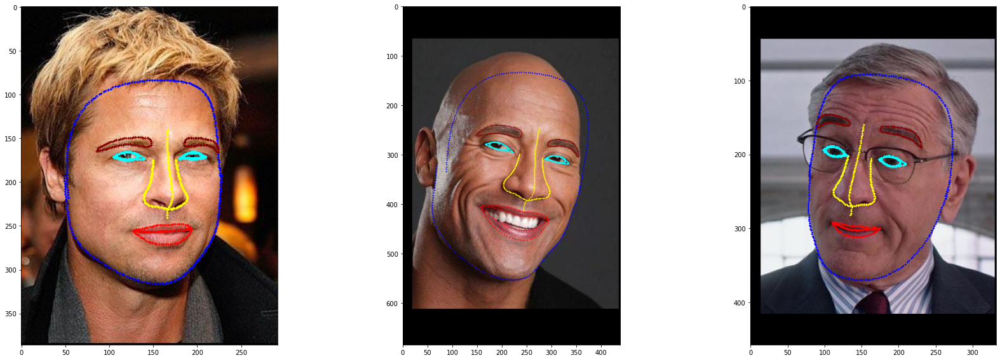

In [6]:
NUM_COLS = 3
NUM_ROWS = 1

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(train_samples_for_visualization)):
    sample = copy.deepcopy(train_samples_for_visualization[i])
    img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)

plt.tight_layout() # отступы между соседними рисунками
plt.show()

### Подготовим несколько train примеров для визуализации:

In [7]:
dwayne_johnson_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/acf8a79eb7f4c7709c8b9b22ad7dcf91.jpg"
fifty_cent_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/83b604d583d5b01e2f102f86598017ba.jpg"
robert_de_niro_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/3ce64cc92545b9c33424f2ef65bb86f0.jpg"
james_franco_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/b0748b70cd104dcd65f0ac378214cf85.jpg"
brad_pitt_img_path2 = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/eb31c44b76a69d837a4b7e4a8a6af056.jpg"
andrey_arshavin_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/1b41c68d084922d281cb5e1ee6a65c59.jpg"
brad_pitt_img_path3 = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/d5a277caf04a277113cbdf6590bb1f6f.jpg"
zendaya_img_path = "/kaggle/input/vkcv2022-contest-01-facial-landmarks/contest01_data/train/images/910ec52a981b5fd07577501e8bc7a040.jpg"

train_images_for_visualization_path = set([
    dwayne_johnson_img_path,
    fifty_cent_img_path,
    robert_de_niro_img_path,
    james_franco_img_path,
    brad_pitt_img_path2,
    andrey_arshavin_img_path,
    brad_pitt_img_path3,
    zendaya_img_path,
])

train_samples_for_visualization = []

img_paths = []
img_landmarks = []


with open(PATH_TRAIN_LANDMARK, "rt") as fp:
    for i, line in enumerate(fp):
        if i == 0:
            continue  # skip header
        
        elements = line.strip().split("\t")
        image_name = os.path.join(PATH_TRAIN_IMAGE, elements[0])
        
        if image_name in train_images_for_visualization_path:
            
            img_paths.append(image_name)
            
            landmarks = list(map(np.int32, elements[1:]))
            landmarks = np.array(landmarks, dtype=np.int32).reshape((len(landmarks) // 2, 2))
            
            img_landmarks.append(landmarks)

img_landmarks = torch.as_tensor(img_landmarks)

for i, img_name in enumerate(img_paths):
    sample = {}
    
    image = cv2.imread(img_name)      # читаем изображение
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
    
    sample["image"] = image
    sample["landmarks"] = img_landmarks[i]
    
    train_samples_for_visualization.append(sample)

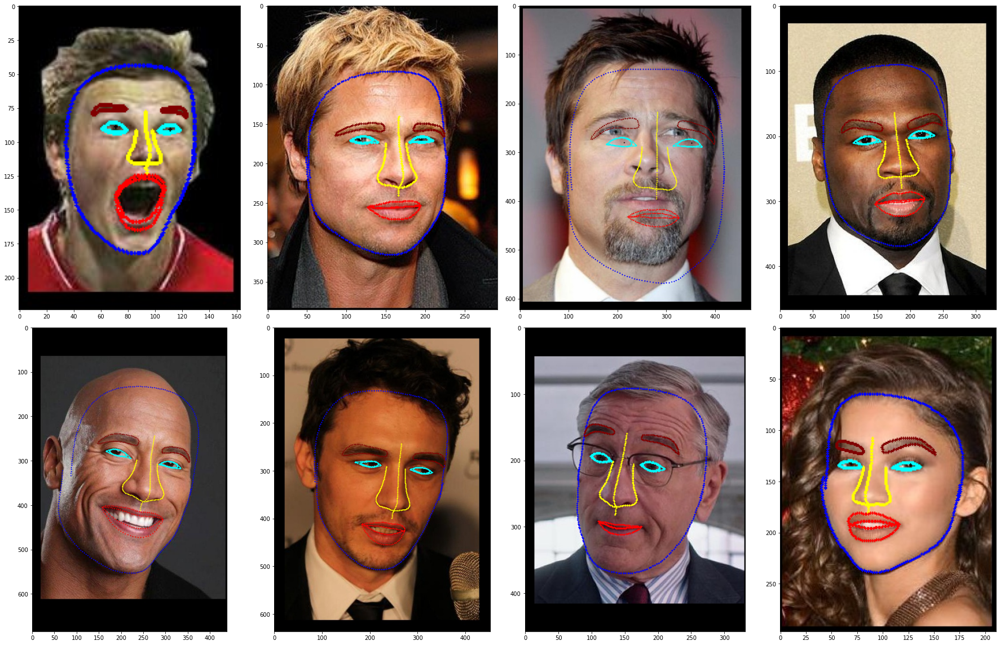

In [8]:
NUM_COLS = 4
NUM_ROWS = 2

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(train_samples_for_visualization)):
    sample = copy.deepcopy(train_samples_for_visualization[i])
    img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)

plt.tight_layout() # отступы между соседними рисунками
plt.show()

### Класс для датасета:

In [9]:
class ThousandLandmarksDataset(Dataset):
    """Класс датасет для изображений и соответствующих ключевых точек лиц."""
    def __init__(self, root, transforms, split="train", augmentations1=None, augmentations2=None):
        super(ThousandLandmarksDataset, self).__init__()
        
        # Задаём путь до папки train или test.
        self.root = root
        
        # Задаем путь до ключевых точек. 
        if split != "test":
            landmark_file_name = os.path.join(root, 'landmarks.csv')
        else:
            landmark_file_name = os.path.join(root, "test_points.csv")
        
        # Задаем путь до папки с картинками.
        images_root = os.path.join(root, "images")

        self.image_names = [] # список путей до изображений
        self.landmarks = []   # список массивов ключевых точек
        
        # Считаем число строк в файле с ключевыми точками.
        with open(landmark_file_name, "rt") as fp:
            num_lines = sum(1 for line in fp)
        num_lines -= 1  # header

        with open(landmark_file_name, "rt") as fp:
            for i, line in tqdm(enumerate(fp), total=num_lines + 1):
                if i == 0:
                    continue  # skip header
                if split == "train" and i == int(TRAIN_SIZE * num_lines):
                    break  # reached end of train part of data
                elif split == "val" and i < int(TRAIN_SIZE * num_lines):
                    continue  # has not reached start of val part of data
                    
                elements = line.strip().split("\t")
                image_name = os.path.join(images_root, elements[0])
                self.image_names.append(image_name)

                if split in ("train", "val"):
                    landmarks = list(map(np.int32, elements[1:]))
                    landmarks = np.array(landmarks, dtype=np.int32).reshape((len(landmarks) // 2, 2))
                    self.landmarks.append(landmarks)

        if split in ("train", "val"):
            self.landmarks = torch.as_tensor(self.landmarks)
        else:
            self.landmarks = None
        
        self.transforms = transforms # трансформации, которые будут применяться к каждому изображению
        self.augmentations1 = augmentations1
        self.augmentations2 = augmentations2

    def __getitem__(self, idx):
        """
        Для обращения к датасету как к списку по индексу.
        Возвращает словарь, с ключевыми точками, изображением, и атрибутами трансформаций. 
        """
        sample = {}
        if self.landmarks is not None: # для train и val
            landmarks = self.landmarks[idx]
            sample["landmarks"] = landmarks

        image = cv2.imread(self.image_names[idx])      # читаем изображение
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
        sample["image"] = image
        
        # Агументации с преобразованием ключевых точек:
        if self.augmentations1 is not None:
            transformed = self.augmentations1(image=np.array(sample['image']), keypoints=np.array(sample["landmarks"]).reshape(-1, 2))
            sample['image'], sample["landmarks"] = torch.tensor(transformed['image']), torch.tensor(transformed['keypoints']).reshape(-1)
            
            
        # Агументации без преобразований ключевых точек:
        if self.augmentations2 is not None:
            transformed = self.augmentations2(image=np.array(sample['image']))
            sample['image'] = np.array(transformed['image'])
        
#         # Если захочешь посмотреть на аугментации.
#         img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]).reshape(-1, 2))
#         f = plt.imshow(img_tmp)
#         plt.show()
            

        # Применение трансформаций.
        if self.transforms is not None:
            sample = self.transforms(sample)
            if self.landmarks is not None: # для train и val
                sample["landmarks"] = sample["landmarks"].reshape(-1) 

        return sample

    def __len__(self):
        return len(self.image_names)

### Задаем преобразования:

In [10]:
class ScaleMinSideToSize:
    """
    Умножение ширины и высоты изображения на некоторый коэффициент f, так, чтобы
    после преобразования меньшая сторона изображения была размера CROP_SIZE.
    """
    
    def __init__(self, size=(CROP_SIZE, CROP_SIZE), elem_name='image'):
        # self.size = torch.tensor(size, dtype=torch.float)
        self.size = np.asarray(size, dtype=float)
        self.elem_name = elem_name

    def __call__(self, sample):
        img = sample[self.elem_name]
        h, w, _ = img.shape
        if h > w:
            f = self.size[0] / w
        else:
            f = self.size[1] / h

        sample[self.elem_name] = cv2.resize(src=img, dsize=None, fx=f, fy=f, interpolation=cv2.INTER_AREA)
        sample["scale_coef"] = f # запоминаем параметр преобразования
        
        # Если есть ключевые точки, то их нужно преобразовать соответсвующим образом.
        if 'landmarks' in sample:
            landmarks = sample['landmarks'].reshape(-1, 2).float()
            landmarks = landmarks * f
            sample['landmarks'] = landmarks.reshape(-1)

        return sample

Смотрим на преобразование в деле:

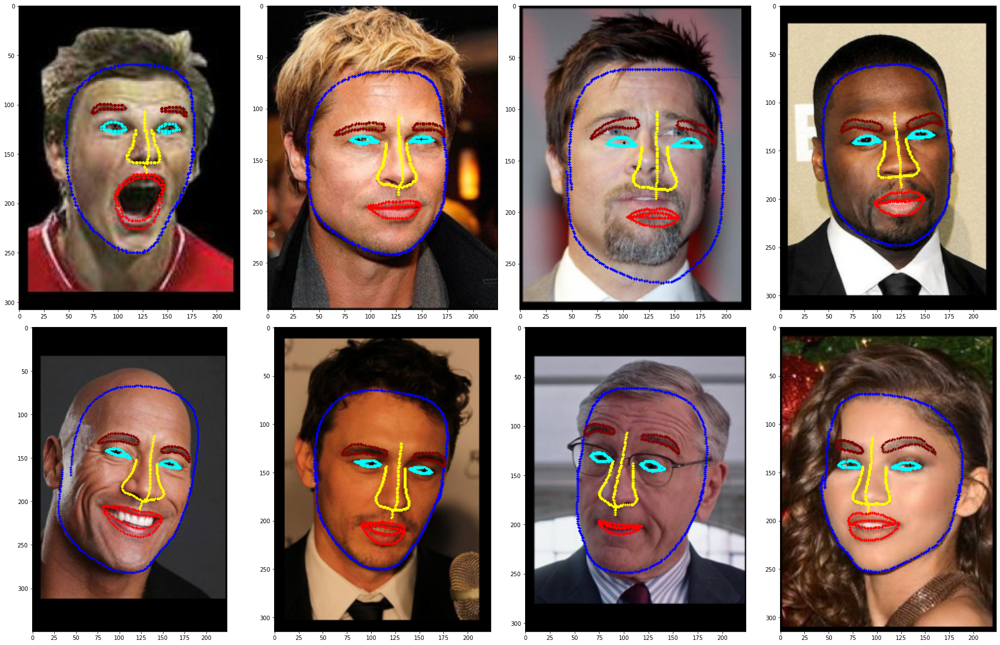

In [11]:
NUM_COLS = 4
NUM_ROWS = 2

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(train_samples_for_visualization)):
    sample = ScaleMinSideToSize((CROP_SIZE, CROP_SIZE))(train_samples_for_visualization[i])
    img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]).reshape(-1, 2))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)

plt.tight_layout() # отступы между соседними рисунками
plt.show()

In [12]:
class CropCenter:
    """
    Обрезаем изображение, чтобы оно стало размера CROP_SIZE * CROP_SIZE.
    Учитывая ScaleMinSideToSize тут будет обрез лишь по одной оси.
    Обрезаем слева и справа равномерно.
    """
    def __init__(self, size=CROP_SIZE, elem_name='image'):
        self.size = size
        self.elem_name = elem_name

    def __call__(self, sample):
        img = sample[self.elem_name]
        h, w, _ = img.shape
        margin_h = (h - self.size) // 2
        margin_w = (w - self.size) // 2
        sample[self.elem_name] = img[margin_h:margin_h + self.size, margin_w:margin_w + self.size]
        # Запоминаем параметры преобразования
        sample["crop_margin_x"] = margin_w
        sample["crop_margin_y"] = margin_h
        
        # Если есть ключевые точки, то их нужно преобразовать соответсвующим образом.
        if 'landmarks' in sample:
            landmarks = sample['landmarks'].reshape(-1, 2)
            landmarks -= torch.tensor((margin_w, margin_h), dtype=landmarks.dtype)[None, :]
            sample['landmarks'] = landmarks.reshape(-1)

        return sample

Смотрим на преобразование в деле:

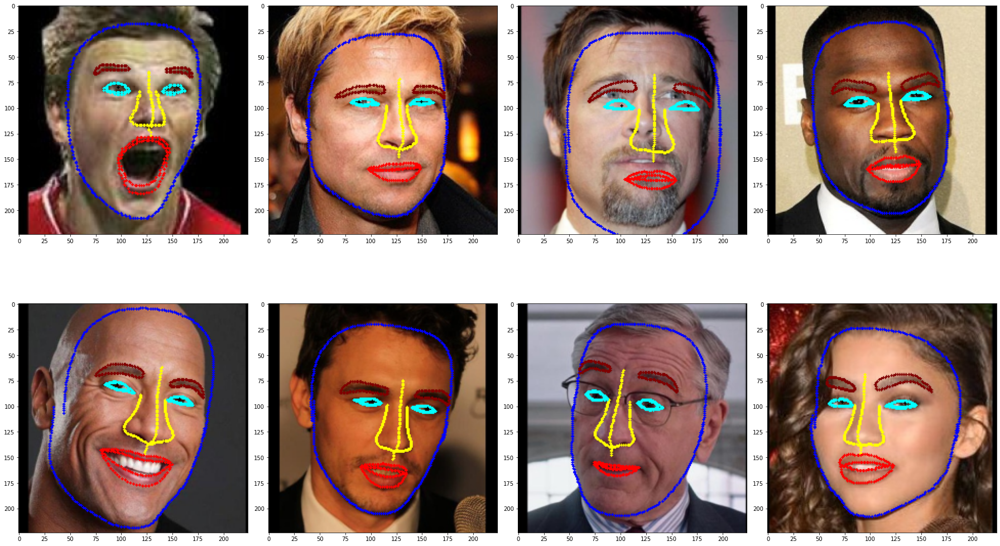

In [13]:
NUM_COLS = 4
NUM_ROWS = 2

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(train_samples_for_visualization)):
    sample = ScaleMinSideToSize((CROP_SIZE, CROP_SIZE))(train_samples_for_visualization[i])
    sample = CropCenter(CROP_SIZE)(sample)
    img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]).reshape(-1, 2))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)

plt.tight_layout() # отступы между соседними рисунками
plt.show()

In [14]:
class TransformByKeys:
    def __init__(self, transform, names):
        self.transform = transform
        self.names = set(names)

    def __call__(self, sample):
        for name in self.names:
            if name in sample:
                sample[name] = self.transform(sample[name])

        return sample

In [15]:
train_transforms = transforms.Compose([
     ScaleMinSideToSize((CROP_SIZE, CROP_SIZE)),
     CropCenter(CROP_SIZE),
     TransformByKeys(transforms.ToPILImage(), ("image",)),
     TransformByKeys(transforms.ToTensor(), ("image",)),
     TransformByKeys(transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), ("image",)),
])

### Аугментации

In [16]:
train_augmentations1 = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate([-25, 25], p=0.3),
], keypoint_params=A.KeypointParams(format='xy', remove_invisible=False))

train_augmentations2 = A.Compose([
    A.GaussNoise(p=0.1, var_limit=(10.0, 30.0)),
    A.RandomBrightnessContrast(p=0.1),
    A.CoarseDropout(p=0.2, min_holes=1, max_holes=3, min_width=30, max_width=50, min_height=30, max_height=50),
    A.ToGray(p=0.1), 
])

Смотрим на примеры аугментаций:

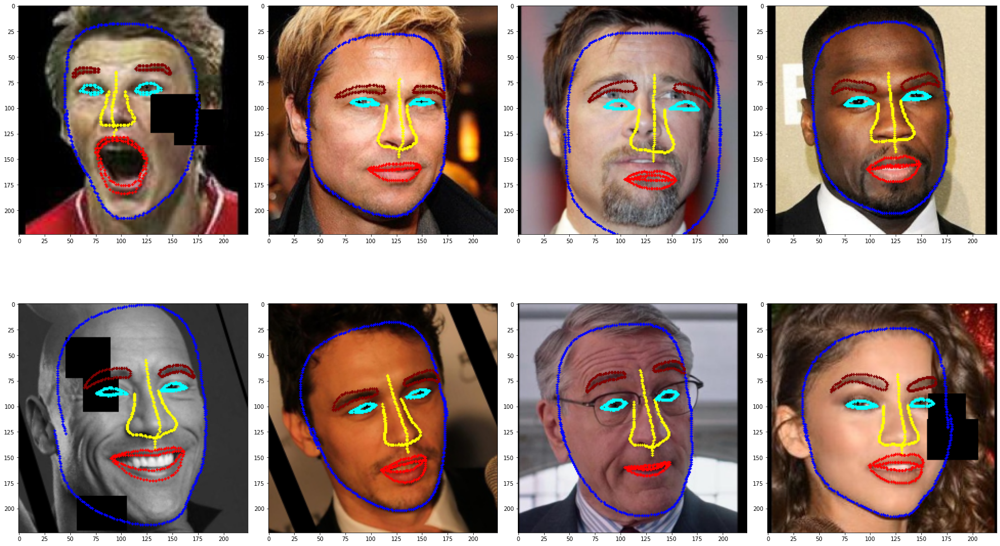

In [17]:
NUM_COLS = 4
NUM_ROWS = 2

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(train_samples_for_visualization)):
    sample = copy.deepcopy(train_samples_for_visualization[i])
    
    sample = ScaleMinSideToSize((CROP_SIZE, CROP_SIZE))(sample)
    sample = CropCenter(CROP_SIZE)(sample)
    
    transformed = train_augmentations1(image=np.array(sample['image']), keypoints=np.array(sample["landmarks"]).reshape(-1, 2))
    sample['image'], sample["landmarks"] = transformed['image'], torch.Tensor(transformed['keypoints'])
    
    transformed = train_augmentations2(image=np.array(sample['image']))
    sample['image'] = transformed['image']
    
    img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]).reshape(-1, 2))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)

plt.tight_layout() # отступы между соседними рисунками
plt.show()

### Обратные преобразования ключевых точек:

In [18]:
def restore_landmarks(landmarks, f, margins):
    """Обратные преобразования для ключевых точек на одном изображении."""
    dx, dy = margins
    landmarks[:, 0] += dx
    landmarks[:, 1] += dy
    landmarks /= f
    return landmarks

In [19]:
def restore_landmarks_batch(landmarks, fs, margins_x, margins_y):
    """Обратные преобразования для ключевых точек на батче."""
    landmarks[:, :, 0] += margins_x[:, None]
    landmarks[:, :, 1] += margins_y[:, None]
    landmarks /= fs[:, None, None]
    return landmarks

### Функции для обучения, валидации и итогового предсказания:

In [20]:
def train(model, loader, loss_fn, optimizer, scheduler, device):
    model.train()
    train_loss = []
    for batch in tqdm(loader, total=len(loader), desc="training..."):
        images = batch["image"].to(device)               # batch x 3 x CROP_SIZE x CROP_SIZE
        landmarks = batch["landmarks"].to(device)        # batch x (2 * NUM_PTS)
        
        pred_landmarks = model(images)  # batch x (2 * NUM_PTS)
        loss = loss_fn(pred_landmarks, landmarks)
        
        loss.backward()
        optimizer.step()

        train_loss.append(loss.item())
        optimizer.zero_grad()
        
    return np.mean(train_loss)

In [21]:
def validate(model, loader, loss_fn, device):
    model.eval()
    val_loss = []
    true_val_loss = []
    for batch in tqdm(loader, total=len(loader), desc="validation..."):
        images = batch["image"].to(device)
        landmarks = batch["landmarks"]

        with torch.no_grad():
            pred_landmarks = model(images).cpu()
        loss = loss_fn(pred_landmarks, landmarks)
        val_loss.append(loss.item())
        
        # Расчет true score на валидации
        fs = batch["scale_coef"].numpy()
        margins_x = batch["crop_margin_x"].numpy()
        margins_y = batch["crop_margin_y"].numpy()
        
        landmarks = landmarks.numpy().reshape((len(landmarks), NUM_PTS, 2)) 
        pred_landmarks = pred_landmarks.numpy().reshape((len(pred_landmarks), NUM_PTS, 2)) 
        
        true_landmarks = restore_landmarks_batch(landmarks, fs, margins_x, margins_y).reshape(-1, 1)
        true_pred_landmarks = restore_landmarks_batch(pred_landmarks, fs, margins_x, margins_y).reshape(-1, 1)
        true_loss = np.mean((true_landmarks - true_pred_landmarks) ** 2)
        true_val_loss.append(true_loss.item())

    return np.mean(val_loss), np.mean(true_val_loss)

In [22]:
def predict(model, loader, device):
    model.eval()
    predictions = np.zeros((len(loader.dataset), NUM_PTS, 2))
    for i, batch in enumerate(tqdm(loader, total=len(loader), desc="test prediction...")):
        images = batch["image"].to(device)

        with torch.no_grad():
            pred_landmarks = model(images).cpu()
        pred_landmarks = pred_landmarks.numpy().reshape((len(pred_landmarks), NUM_PTS, 2))  # B x NUM_PTS x 2

        fs = batch["scale_coef"].numpy()  # B
        margins_x = batch["crop_margin_x"].numpy()  # B
        margins_y = batch["crop_margin_y"].numpy()  # B
        prediction = restore_landmarks_batch(pred_landmarks, fs, margins_x, margins_y)  # B x NUM_PTS x 2
        predictions[i * loader.batch_size: (i + 1) * loader.batch_size] = prediction

    return predictions

### Создаём datasets и dataloaders:

In [23]:
# Без аугментаций
train_dataset = ThousandLandmarksDataset(PATH_TRAIN, train_transforms, split="train")

# C аугментациями
# train_dataset = ThousandLandmarksDataset(PATH_TRAIN, train_transforms, "train", train_augmentations1, train_augmentations2)

val_dataset = ThousandLandmarksDataset(PATH_TRAIN, train_transforms, split="val")

100%|██████████| 64001/64001 [00:15<00:00, 4148.15it/s]


In [24]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True,
                                  shuffle=True, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True,
                                shuffle=False, drop_last=False)

/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


### Задаём модель:

**convnext**

In [25]:
# Загрузка модели
# model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'convnext', pretrained=True)

# # Замена fc слоя на требуемый (отличается от того как делали для моделей мз torchvision.models)
# model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, 2 * NUM_PTS, bias=True)

**resnet50**

In [26]:
# Загрузка модели
model = models.resnet50(pretrained=True)
# model = models.resnext50_32x4d(pretrained=True)

# Поменяли последний слой на свой.
model.fc = nn.Linear(model.fc.in_features, 2 * NUM_PTS, bias=True)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

**densenet161**

In [27]:
# model = models.densenet161(pretrained=False)
# model.classifier = nn.Linear(model.classifier.in_features, 2 * NUM_PTS, bias=True)

**Разморозка**

In [28]:
# Обучаем все
for param in model.parameters():
    param.requires_grad = True
    
# Инициализируем bias, чтобы целиться в середину
model.fc.bias.data.fill_(CROP_SIZE / 2)

# Переводим на текущий device
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

**Загрузка сохраненной модели**

In [29]:
# model_name = "resnext50-32x4d"
# path_to_resnext50_32x4d = "../input/resnext50-32x4d/resnext50_32x4d_best.pth"
# model = models.resnext50_32x4d(pretrained=False)
# model.fc = nn.Linear(model.fc.in_features, 2 * NUM_PTS, bias=True)
# model.to(device)

# # Загрузка весов
# with open(path_to_resnext50_32x4d, "rb") as fp:
#     best_state_dict = torch.load(fp, map_location="cpu")
#     model.load_state_dict(best_state_dict)

**Задаем оптимизатор, лосс, шедулер**

In [30]:
optimizer = optim.Adam(model.parameters(), lr=0.001, amsgrad=True, weight_decay=0.00001)
# optimizer = optim.Adam(model.parameters(), lr=0.00004)
# loss_fn = fnn.mse_loss
loss_fn = nn.SmoothL1Loss()

# Каждые step_size эпох lr умножается на gamma.
# exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
exp_lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=1, factor=0.7)

### Обучение и валидация:

In [31]:
os.makedirs("runs", exist_ok=True)

epochs_num = 1 # 20
name_attempt = "resnet50"

print("Ready for training...")
best_true_val_loss = np.inf
for epoch in range(epochs_num):
    train_loss = train(model, train_dataloader, loss_fn, optimizer, exp_lr_scheduler, device=device)
    val_loss, true_val_loss = validate(model, val_dataloader, loss_fn, device=device)
    exp_lr_scheduler.step(true_val_loss)
    print("Epoch #{:2}:\ttrain loss: {:5.2}\tval loss: {:5.2}\tval mse: {:5.2}".format(epoch + 1, train_loss, val_loss, true_val_loss))
    if true_val_loss < best_true_val_loss:
        best_true_val_loss = true_val_loss
        with open(os.path.join("runs", f"{name_attempt}_best.pth"), "wb") as fp:
            torch.save(model.state_dict(), fp)

Ready for training...


validation...: 100%|██████████| 201/201 [00:59<00:00,  3.40it/s]


Epoch # 1:	train loss:   4.3	val loss:   2.7	val mse: 2.4e+01


### Делаем предсказания:

In [32]:
def create_submission(path_to_data, test_predictions, path_to_submission_file):
    test_dir = os.path.join(path_to_data, "test")

    output_file = path_to_submission_file
    wf = open(output_file, 'w')
    wf.write(SUBMISSION_HEADER)

    mapping_path = os.path.join(test_dir, 'test_points.csv')
    mapping = pd.read_csv(mapping_path, delimiter='\t')

    for i, row in mapping.iterrows():
        file_name = row[0]
        point_index_list = np.array(eval(row[1]))
        points_for_image = test_predictions[i]
        needed_points = points_for_image[point_index_list].astype(np.int32)
        wf.write(file_name + ',' + ','.join(map(str, needed_points.reshape(2 * len(point_index_list)))) + '\n')

In [33]:
test_dataset = ThousandLandmarksDataset(PATH_TEST, train_transforms, split="test")
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True,
                             shuffle=False, drop_last=False)

100%|██████████| 16001/16001 [00:00<00:00, 229685.07it/s]


In [34]:
# Загрузка лучших весов
with open(os.path.join("runs", f"{name_attempt}_best.pth"), "rb") as fp:
    best_state_dict = torch.load(fp, map_location="cpu")
    model.load_state_dict(best_state_dict)

In [35]:
# Делаю предсказние
test_predictions = predict(model, test_dataloader, device)
with open(os.path.join("runs", f"{name_attempt}_test_predictions.pkl"), "wb") as fp:
    pickle.dump({"image_names": test_dataset.image_names, "landmarks": test_predictions}, fp)

test prediction...: 100%|██████████| 250/250 [01:12<00:00,  3.47it/s]


In [36]:
create_submission(PATH_DATA, test_predictions, os.path.join("runs", f"{name_attempt}_submit.csv"))

### Ансамблирование предсказаний:

In [37]:
# my_sub = pd.read_csv("../input/mycsv/resnet50_submit.csv")
# my_sub2 = pd.read_csv("../input/mycsv/densenet_161_submit.csv")
# landmarks_columns = my_sub.columns.to_list()[1:]
# my_sub[landmarks_columns] = (my_sub[landmarks_columns] + my_sub2[landmarks_columns]) / 2
# my_sub[landmarks_columns] = my_sub[landmarks_columns].astype(int)
# my_sub.to_csv('ensemble_preds.csv', sep=',', index=False)

### Просмотр результатов на фото моих друзей

In [38]:
class MyThousandLandmarksDataset(Dataset):
    """Класс датасет для изображений и соответствующих ключевых точек лиц."""
    def __init__(self, root, transforms, split="train", augmentations1=None, augmentations2=None):
        super(MyThousandLandmarksDataset, self).__init__()
        
        # Задаём путь до папки train или test.
        self.root = root
        
        # Задаем путь до ключевых точек. 
        if split != "test":
            landmark_file_name = os.path.join(root, 'landmarks.csv')
        else:
            landmark_file_name = os.path.join(root, "test_points.csv")
        
        # Задаем путь до папки с картинками.
        images_root = os.path.join(root, "images")

        # Список путей до изображений.
        self.image_names = [
            "../input/my-photo/Pasha1.jpg",
            "../input/my-photo/Altana5.jpeg",
            "../input/my-photo/Anton.JPG",
            "../input/my-photo/Diana.jpg",
            "../input/my-photo/Sait5.jpg",
            "../input/my-photo/Elya.jpg",
            "../input/my-photo/Vlad1.jpg",
            "../input/my-photo/Tema.jpg",
            "../input/my-photo/Alex.JPG",
        ]
        self.landmarks = None
        
        self.transforms = transforms # трансформации, которые будут применяться к каждому изображению
        self.augmentations1 = augmentations1
        self.augmentations2 = augmentations2

    def __getitem__(self, idx):
        """
        Для обращения к датасету как к списку по индексу.
        Возвращает словарь, с ключевыми точками, изображением, и атрибутами трансформаций. 
        """
        sample = {}
        if self.landmarks is not None: # для train и val
            landmarks = self.landmarks[idx]
            sample["landmarks"] = landmarks

        image = cv2.imread(self.image_names[idx])      # читаем изображение
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
        sample["image"] = image
        
        # Агументации с преобразованием ключевых точек:
        if self.augmentations1 is not None:
            transformed = self.augmentations1(image=np.array(sample['image']), keypoints=np.array(sample["landmarks"]).reshape(-1, 2))
            sample['image'], sample["landmarks"] = torch.tensor(transformed['image']), torch.tensor(transformed['keypoints']).reshape(-1)
            
            
        # Агументации без преобразований ключевых точек:
        if self.augmentations2 is not None:
            transformed = self.augmentations2(image=np.array(sample['image']))
            sample['image'] = np.array(transformed['image'])
        
#         # Если захочешь посмотреть на аугментации.
#         img_tmp = draw_landmarks(sample["image"], np.array(sample["landmarks"]).reshape(-1, 2))
#         f = plt.imshow(img_tmp)
#         plt.show()
            

        # Применение трансформаций.
        if self.transforms is not None:
            sample = self.transforms(sample)
            if self.landmarks is not None: # для train и val
                sample["landmarks"] = sample["landmarks"].reshape(-1) 

        return sample

    def __len__(self):
        return len(self.image_names)

test prediction...: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


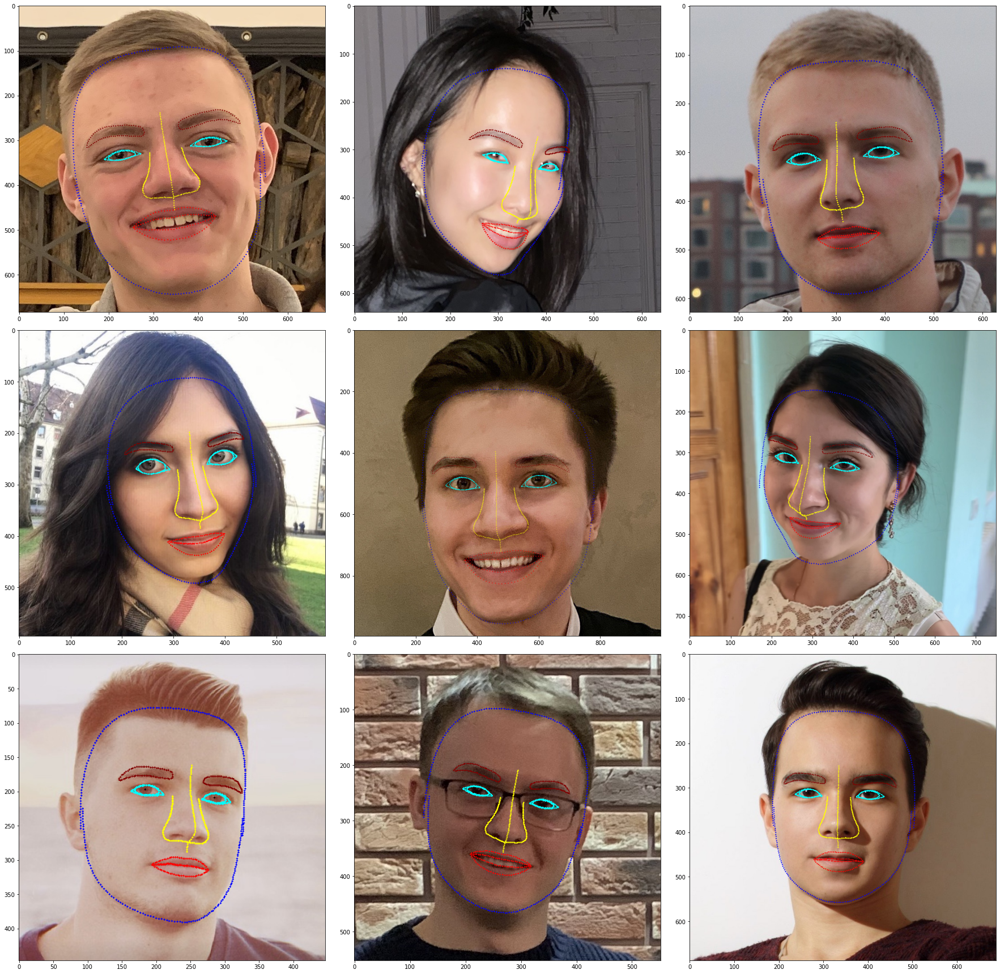

In [39]:
# model_name = "resnext50-32x4d"
# path_to_resnext50_32x4d = "../input/resnext50-32x4d/resnext50_32x4d_best.pth"
path_to_model = "../input/resnext50-32x4d/densenet_best.pth"
model = models.densenet161(pretrained=False)
model.classifier = nn.Linear(model.classifier.in_features, 2 * NUM_PTS, bias=True)
model.to(device)
loss_fn = nn.SmoothL1Loss()

# Загрузка весов
with open(path_to_model, "rb") as fp:
    best_state_dict = torch.load(fp, map_location="cpu")
    model.load_state_dict(best_state_dict)

test_dataset = MyThousandLandmarksDataset(PATH_MY_IMAGES, train_transforms, split="test")
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True,
                             shuffle=False, drop_last=False)

test_predictions = predict(model, test_dataloader, device)

# Список путей до изображений
image_names = test_dataset.image_names

NUM_COLS = 3
NUM_ROWS = 3

plt.figure(figsize=(25, NUM_ROWS * 8))

for i in range(len(image_names)):
    img_name = image_names[i]
    landmarks = test_predictions[i]
    
    image = cv2.imread(img_name)      # читаем изображение
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # перевод в другое цветовое пространство
    img_tmp = draw_landmarks(image, np.array(landmarks))
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)
    plt.imshow(img_tmp)
plt.tight_layout() # отступы между соседними рисунками
plt.show()